# Basic Clustering EDA





## Setup


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
sns.set()

## Loading Data

In [3]:
path = '.\..\..\dataset\PSD_to_Pandas\pump_6dB_00020406_full_spectrum_128.pkl'
df = pd.read_pickle(path)

In [4]:
df.head()

,path,abnormal,ID,file,machine,SNR,218.75,250.0,281.25,312.5,...,7718.75,7750.0,7781.25,7812.5,7843.75,7875.0,7906.25,7937.5,7968.75,8000.0
0,\dataset\6dB\pump\id_00\normal\00000000.wav,0,00,00000000,pump,6dB,0.000004,0.000003,0.000002,0.000002,...,5.316734e-08,4.912297e-08,4.514861e-08,4.101670e-08,3.675315e-08,3.258964e-08,2.884488e-08,2.584378e-08,2.388666e-08,1.160220e-08
1,\dataset\6dB\pump\id_00\normal\00000001.wav,0,00,00000001,pump,6dB,0.000003,0.000003,0.000002,0.000002,...,4.854261e-08,4.483064e-08,4.085615e-08,3.666346e-08,3.244671e-08,2.848889e-08,2.507934e-08,2.246389e-08,2.082307e-08,1.013221e-08
2,\dataset\6dB\pump\id_00\normal\00000002.wav,0,00,00000002,pump,6dB,0.000002,0.000002,0.000002,0.000001,...,5.378221e-08,4.898495e-08,4.364978e-08,3.830554e-08,3.348502e-08,2.945001e-08,2.619801e-08,2.369038e-08,2.203722e-08,1.072503e-08
3,\dataset\6dB\pump\id_00\normal\00000003.wav,0,00,00000003,pump,6dB,0.000004,0.000003,0.000003,0.000002,...,6.512921e-08,5.893400e-08,5.186951e-08,4.495403e-08,3.882366e-08,3.368394e-08,2.954767e-08,2.645704e-08,2.452590e-08,1.193362e-08
4,\dataset\6dB\pump\id_00\normal\00000004.wav,0,00,00000004,pump,6dB,0.000003,0.000002,0.000002,0.000001,...,5.914793e-08,5.402140e-08,4.937083e-08,4.518709e-08,4.144084e-08,3.815570e-08,3.540896e-08,3.331252e-08,3.198863e-08,1.576743e-08


In [7]:
# let's get the frequencies of these bins
frequ = df.columns[df.dtypes==np.float64]

descriptive = [label for label in df.columns[df.dtypes==np.object] if not 'abnormal' in label]

target = ['abnormal']

IDs = df.ID.unique()

In [8]:
descriptive

['path', 'ID', 'file', 'machine', 'SNR']

C:\ProgramData\Anaconda3\envs\mimiibaseTF2GPU\lib\site-packages\ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
C:\ProgramData\Anaconda3\envs\mimiibaseTF2GPU\lib\site-packages\ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
C:\ProgramData\Anaconda3\envs\mimiibaseTF2GPU\lib\site-packages\ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
C:\ProgramData\Anaconda3\envs\mimiibaseTF2GPU\lib\site-packages\ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
C:\ProgramData\Anaconda3\envs\mimiibaseTF2GPU\lib\site-packages\ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
C:\ProgramData\Anaconda3\envs\mimiibaseTF2GPU\lib\site-packages\ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match Dat

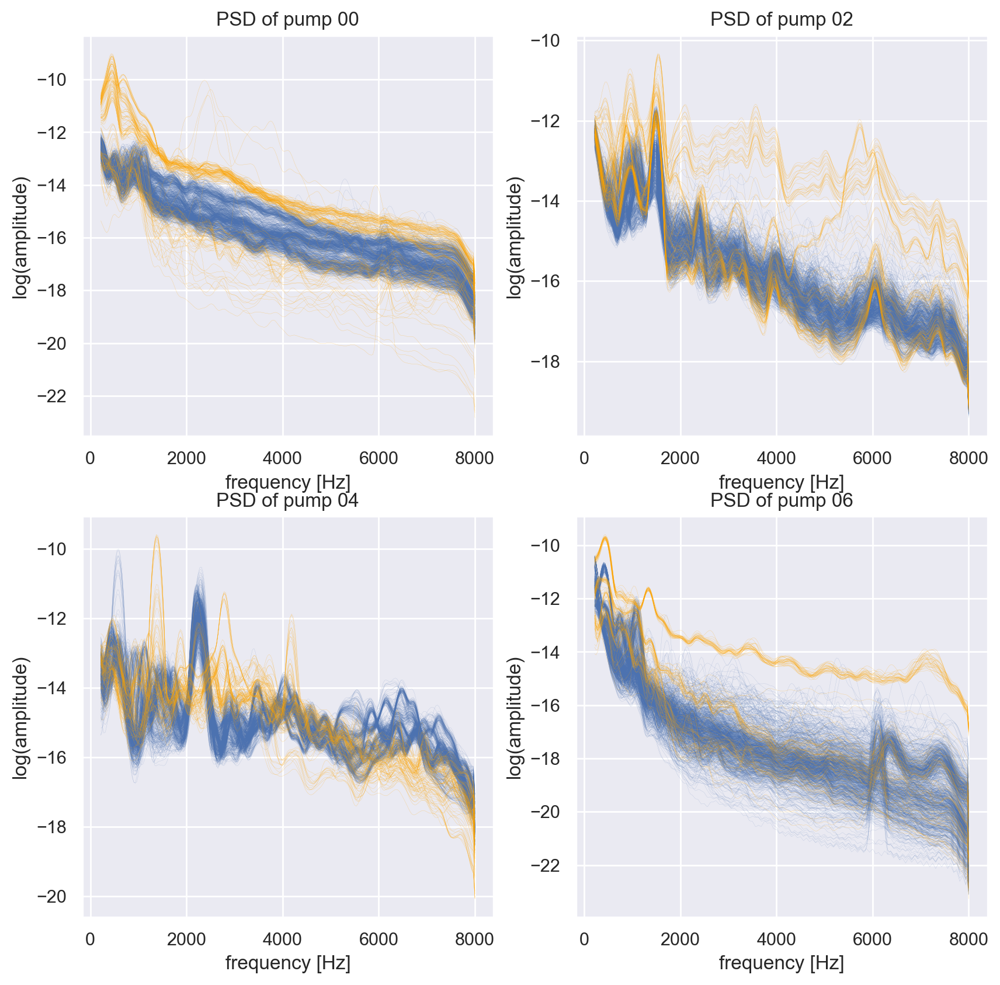

In [9]:
plt.figure(figsize=(10, 10), dpi=200)

for i, ID in enumerate(IDs):
    plt.subplot(2, 2, i+1)
    ax1 = plt.plot(frequ, df[df.ID == ID][frequ][df.abnormal==0].apply(lambda x : np.log(x)).T
                                , linewidth=.1, alpha=.4, color='b'
                                , label='normal op.');
    ax2 = plt.plot(frequ, df[df.ID == ID][frequ][df.abnormal==1].apply(lambda x : np.log(x)).T
                                , linewidth=.1, alpha=.6, color='orange', label='abnormal op.');
    plt.xlabel('frequency [Hz]')
    plt.ylabel('log(amplitude)')
    plt.title('PSD of pump {00}'.format(ID))

#plt.legend()
plt.show()

## Features Explained

In [10]:
from sklearn.metrics import silhouette_score, davies_bouldin_score, v_measure_score

## Scaling



In [12]:
# Logtransform

In [11]:
# StandardScaler
from sklearn.preprocessing import StandardScaler

# fit the scaler on the "normal" operation data
scaler = StandardScaler()
X = {}
y = {}
for ID in IDs:
    scaler.fit(df[df.ID==ID][df['abnormal']==0][frequ])

    # transform all data, including "abnormal" operation
    X[ID] = scaler.transform(df[df.ID==ID][frequ])
    
    # to properly mask the operation type in the future we will create the target value accordingly
    y[ID] = df.abnormal[df.ID==ID]

C:\ProgramData\Anaconda3\envs\mimiibaseTF2GPU\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
C:\ProgramData\Anaconda3\envs\mimiibaseTF2GPU\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
C:\ProgramData\Anaconda3\envs\mimiibaseTF2GPU\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':
C:\ProgramData\Anaconda3\envs\mimiibaseTF2GPU\lib\site-packages\ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


## Dimensionality Reduction


### Principal component analysis - PCA

In [13]:
from sklearn.decomposition import PCA
n_prin_comp = 50

X_pca = {}
PCAs = {}
for ID in IDs:
    PCAs[ID] = PCA(n_components=n_prin_comp, svd_solver='full')
    # fit the PCA only on the "normal" operation data
    PCAs[ID].fit(X[ID][y[ID]==0])

    # transform all data accordingly
    X_pca[ID] = PCAs[ID].transform(X[ID])

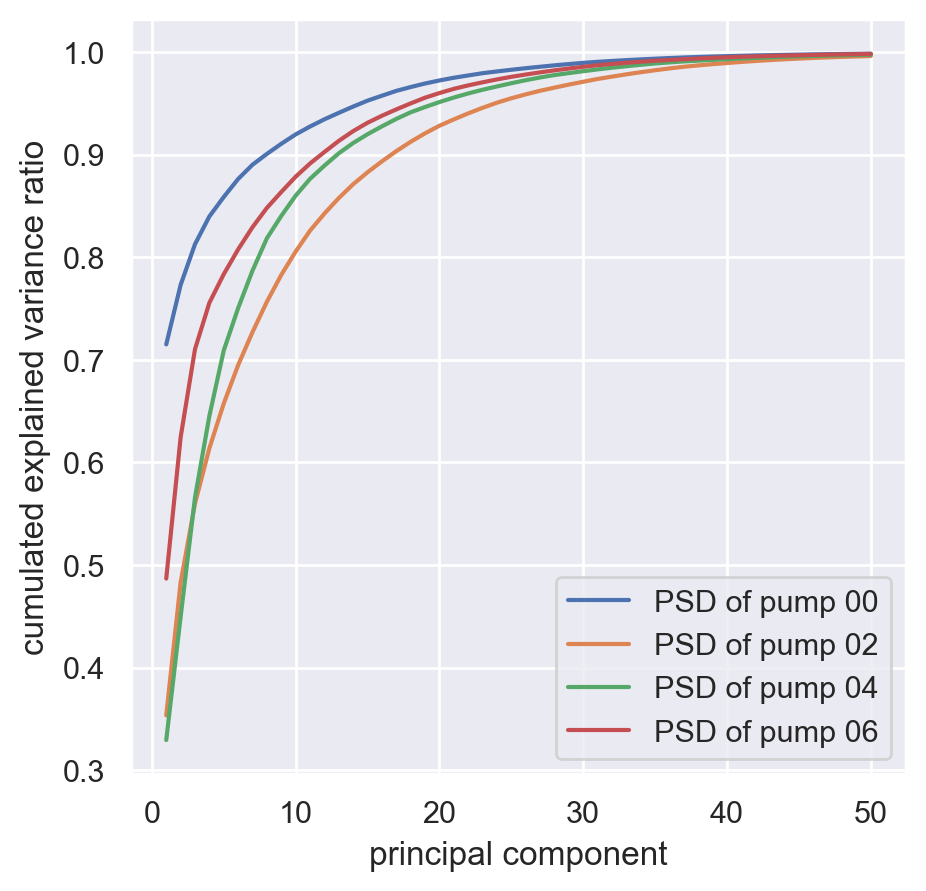

In [14]:
plt.figure(figsize=(5, 5), dpi=200)

for i, ID in enumerate(IDs):
    plt.plot(range(1,n_prin_comp+1), np.cumsum(PCAs[ID].explained_variance_ratio_)
                    , label='PSD of pump {00}'.format(ID))
    plt.xlabel('principal component')
    plt.ylabel('cumulated explained variance ratio')
    plt.legend()
plt.show()

In [16]:
X_pca[ID][y[ID]==0][:,1]

array([  0.01394729,  -2.28609844, -11.16409896, ...,   3.60997419,
        -4.49143576,  -3.71292942])

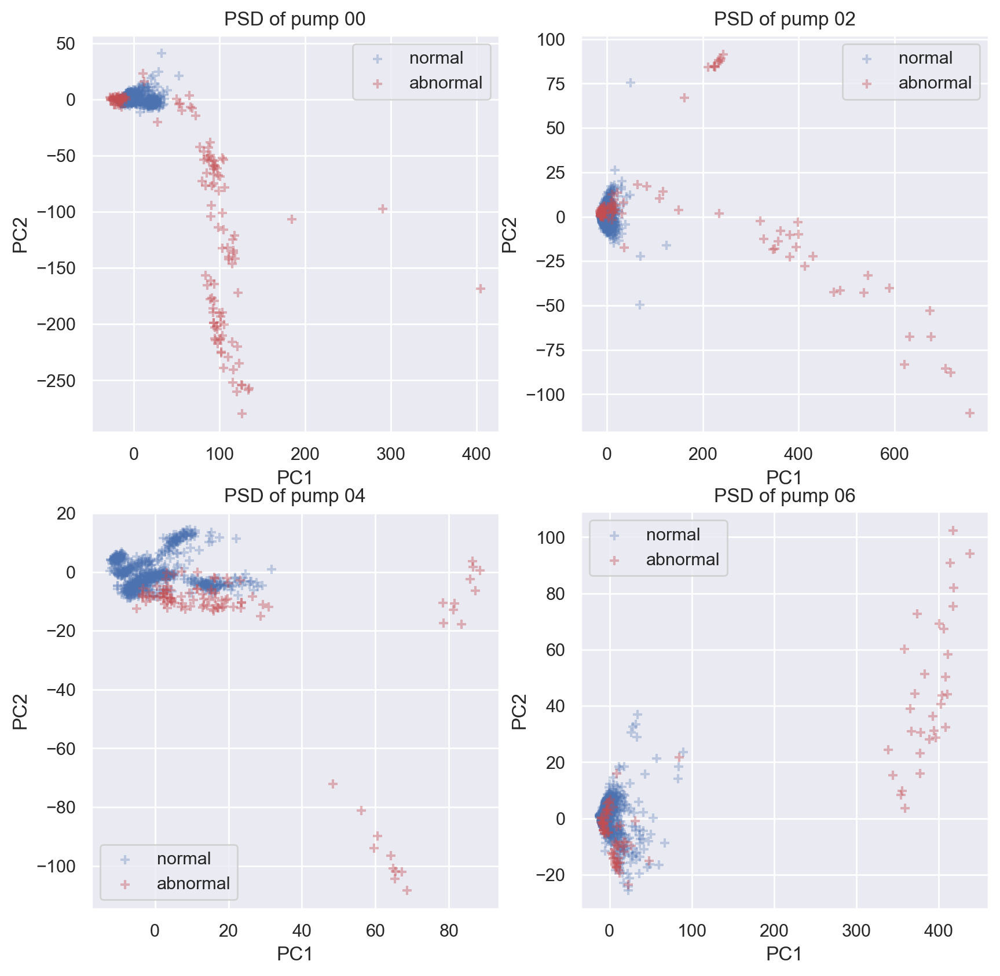

In [17]:
plt.figure(figsize=(10, 10), dpi=200)
for i, ID in enumerate(IDs):
    plt.subplot(2, 2, i+1)
    ax1 = plt.scatter(X_pca[ID][y[ID]==0][:,0], X_pca[ID][y[ID]==0][:,1], color='b'
                        , cmap='seismic', marker='+'
                        , alpha=.3, label=('abnormal', 'normal'))
    ax2 = plt.scatter(X_pca[ID][y[ID]==1][:,0], X_pca[ID][y[ID]==1][:,1], color='r'
                        , cmap='seismic', marker='+'
                        , alpha=.4, label=('abnormal', 'normal'))
    plt.xlabel('PC1')
    plt.ylabel('PC2')
    plt.title('PSD of pump {00}'.format(ID))
    plt.legend((ax1, ax2), ('normal', 'abnormal'))
plt.show()




C:\ProgramData\Anaconda3\envs\mimiibaseTF2GPU\lib\site-packages\ipykernel_launcher.py:29: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


### File =\dataset\6dB\pump\id_06\abnormal\00000036.wav

### File =\dataset\6dB\pump\id_06\abnormal\00000037.wav

### File =\dataset\6dB\pump\id_06\abnormal\00000038.wav

### File =\dataset\6dB\pump\id_06\abnormal\00000039.wav

### File =\dataset\6dB\pump\id_06\abnormal\00000041.wav

### File =\dataset\6dB\pump\id_06\abnormal\00000043.wav

### File =\dataset\6dB\pump\id_06\abnormal\00000045.wav

### File =\dataset\6dB\pump\id_06\abnormal\00000052.wav

### File =\dataset\6dB\pump\id_06\abnormal\00000056.wav

### File =\dataset\6dB\pump\id_06\abnormal\00000057.wav

### File =\dataset\6dB\pump\id_06\abnormal\00000062.wav

### File =\dataset\6dB\pump\id_06\abnormal\00000063.wav

### File =\dataset\6dB\pump\id_06\abnormal\00000064.wav

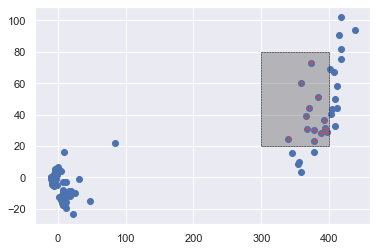

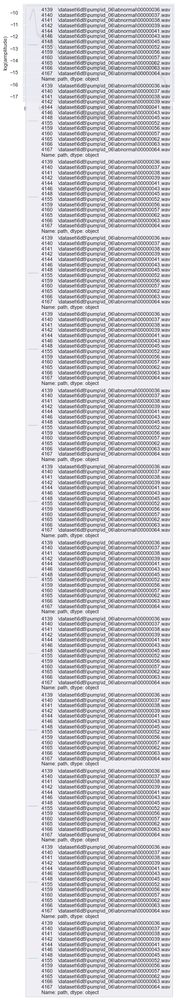

In [96]:
# make a box

def box_outline_for_plot(x_range, y_range):
    return [x_range[0], x_range[1], x_range[1], x_range[0], x_range[0]], \
           [y_range[1], y_range[1], y_range[0], y_range[0], y_range[1]] 

def box_outline_plot(x_range, y_range):
    bx,by = box_outline_for_plot(x_range,y_range)
    ax = plt.gca()
    ax.fill(bx, by, color='gray', alpha=0.5) 
    plt.plot(bx,by,'k--', linewidth=.5)

def box_points(x,y, x_range=[], y_range=[]):
    # x cut 
    if x_range:
        x_cut = np.argwhere(
            np.logical_and(x>=x_range[0] , x<=x_range[1])).reshape(1,-1)
    if y_range:
        y_cut = np.argwhere(
            np.logical_and(y>=y_range[0] , y<=y_range[1])).reshape(1,-1)
    if x_range and y_range: 
        pass

    return np.intersect1d(y_cut, x_cut)
        

def box_points_df(df,idx,ID,abnormal=1):
    if abnormal >-1:
        return df[df.ID==ID][df['abnormal']==abnormal].iloc[idx]
    else:
        # TODO work with 2 index levels
        return df[df.ID==ID].iloc[idx]

from IPython.display import display, Markdown, Audio
import librosa

def box_points_listen(df_box, base_folder, stereo_ch=[0,4]):
    
    for filepath in df_box.path:
        audio_ch  = \
            librosa.load(base_folder+filepath, sr=None, mono=False)
            
        display(Markdown('### File =' + filepath))
        display(Audio(data=[audio_ch[0][stereo_ch[0]], \
                            audio_ch[0][stereo_ch[1]]], \
                      rate=audio_ch[1]))

def box_points_psd_from_pandas(df_box):
    frequ = df_box.columns[df.dtypes==np.float64]
    plt.figure()
    plt.plot(frequ, df_box[frequ].apply(lambda x : np.log(x)).T
                                , linewidth=.5, alpha=.8
                                , label=df_box.path)
    
    plt.xlabel('frequency [Hz]')
    plt.ylabel('log(amplitude)')
    plt.legend()
    #plt.title('PSD {00}'.format(ID))

def box_points_psd_free(ch):
    #TODO
    pass
#TODO MEL spec... usw


y_range=[20,80]
x_range=[300,400]

idx = box_points(X_pca['06'][y['06']==1][:,0],
           X_pca['06'][y['06']==1][:,1]
           ,y_range=[20,80],x_range=[300,400])

df_box = box_points_df(df,idx,ID,abnormal=1)                                     
box_points_listen(df_box, r'../../')
                                        
plt.plot(X_pca['06'][y['06']==1][:,0],X_pca['06'][y['06']==1][:,1],'bo')
plt.plot(X_pca['06'][y['06']==1][:,0][idx],X_pca['06'][y['06']==1][:,1][idx],'r+')
box_outline_plot(y_range=[20,80],x_range=[300,400])


box_points_psd_from_pandas(df_box)



In [100]:
df_box[frequ].apply(lambda x : np.log(x)).iloc[0]

218.75    -10.730446
250.00    -10.647473
281.25    -10.558375
312.50    -10.424217
343.75    -10.230547
             ...    
7875.00   -15.997858
7906.25   -16.111583
7937.50   -16.202063
7968.75   -16.260735
8000.00   -16.974319
Name: 4139, Length: 250, dtype: float64

In [23]:
np.max(X_pca['06'][y['06']==0][:,0])

89.2731485084881

In [34]:
if [6]:
    print('asd')

asd


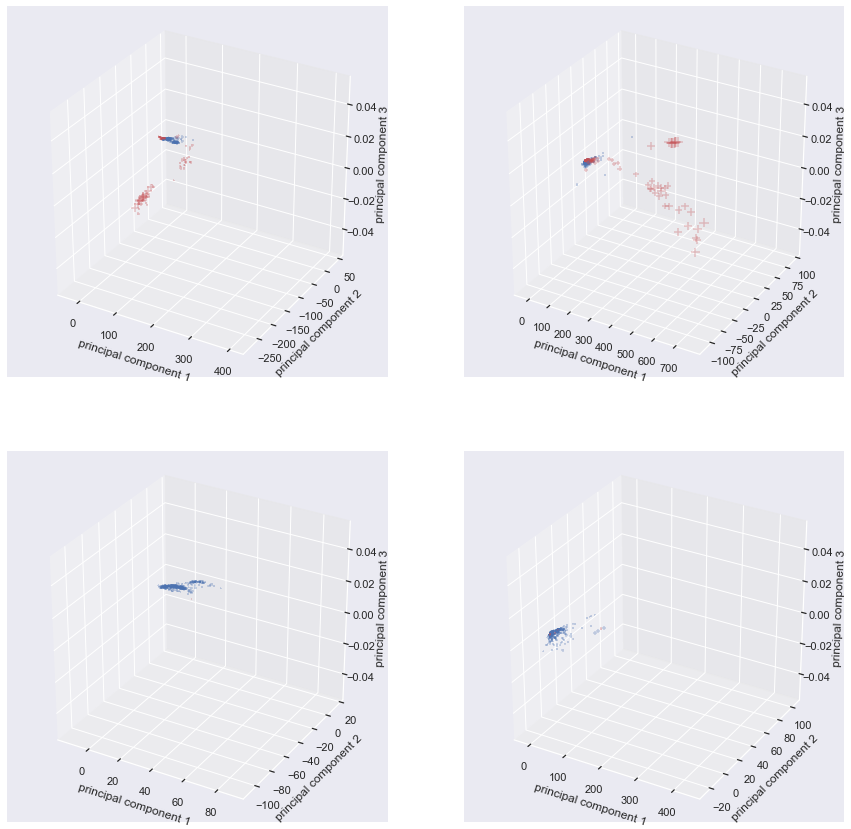

In [18]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(15,15))
for i, ID in enumerate(IDs):
    ax = plt.subplot(2, 2, i+1, projection='3d')

    ax1 = plt.scatter(X_pca[ID][y[ID]==0][:,0], X_pca[ID][y[ID]==0][:,1], X_pca[ID][y[ID]==0][:,2]
                        , color='b', cmap='seismic', marker='+'
                        , alpha=.3, label=('abnormal', 'normal'))
    ax2 = plt.scatter(X_pca[ID][y[ID]==1][:,0], X_pca[ID][y[ID]==1][:,1], X_pca[ID][y[ID]==1][:,2]
                        , color='r', cmap='seismic', marker='+'
                        , alpha=.3, label=('abnormal', 'normal'))

    #ax.scatter(X_pca[:,0], X_pca[:,1], X_pca[:,2], c=df.abnormal+1, cmap='seismic', marker='+', alpha=.3)

    ax.set_xlabel('principal component 1')
    ax.set_ylabel('principal component 2')
    ax.set_zlabel('principal component 3')

    # ax.azim = 225
    # ax.elev = -45
    ax.dist = 10

plt.show()

### t-SNE

In [19]:
from sklearn.manifold import TSNE

t_sne = TSNE(n_components=2)

# transform all data accordingly
X_tsne = t_sne.fit_transform(X)

TypeError: float() argument must be a string or a number, not 'dict'

In [20]:
plt.scatter(X_tsne[:,0], X_tsne[:,1], c=df.abnormal+1, cmap='seismic', marker='+', alpha=.2)

NameError: name 'X_tsne' is not defined

## Clustering Methods

The following table shows a short summary of the methods https://scikit-learn.org/stable/modules/clustering.html


| Method name                  | Parameters                                                       | Scalability                                                 | Usecase                                                                   | Geometry (metric used)                       |
|------------------------------|------------------------------------------------------------------|-------------------------------------------------------------|---------------------------------------------------------------------------|----------------------------------------------|
| K-Means                      | number of clusters                                               | Very large n_samples, medium n_clusters with MiniBatch code | General-purpose, even cluster size, flat geometry, not too many clusters  | Distances between points                     |
| Affinity propagation         | damping, sample preference                                       | Not scalable with n_samples                                 | Many clusters, uneven cluster size, non-flat geometry                     | Graph distance (e.g. nearest-neighbor graph) |
| Mean-shift                   | bandwidth                                                        | Not scalable with n_samples                                 | Many clusters, uneven cluster size, non-flat geometry                     | Distances between points                     |
| Spectral clustering          | number of clusters                                               | Medium n_samples, small n_clusters                          | Few clusters, even cluster size, non-flat geometry                        | Graph distance (e.g. nearest-neighbor graph) |
| Ward hierarchical clustering | number of clusters or distance threshold                         | Large n_samples and n_clusters                              | Many clusters, possibly connectivity constraints                          | Distances between points                     |
| Agglomerative clustering     | number of clusters or distance threshold, linkage type, distance | Large n_samples and n_clusters                              | Many clusters, possibly connectivity constraints, non Euclidean distances | Any pairwise distance                        |
| DBSCAN                       | neighborhood size                                                | Very large n_samples, medium n_clusters                     | Non-flat geometry, uneven cluster sizes                                   | Distances between nearest points             |
| OPTICS                       | minimum cluster membership                                       | Very large n_samples, large n_clusters                      | Non-flat geometry, uneven cluster sizes, variable cluster density         | Distances between points                     |
| Gaussian mixtures            | many                                                             | Not scalable                                                | Flat geometry, good for density estimation                                | Mahalanobis distances to centers             |
| Birch                        | branching factor, threshold, optional global clusterer.          | Large n_clusters and n_samples                              | Large dataset, outlier removal, data reduction.                           | Euclidean distance between points            |


## K-means and the elbow plot

Question: Is KMeans able to identify two types of operation and how distinct is the separation?
As a measure we use:

1. Unsupervised metric: 
    
    a. KMeans-Score

2. Supervised metrics:
    
    a. Silhouette score
    
    b. V-Measure score

In [21]:
from sklearn.cluster import KMeans
X_scaled = X_pca
y = df.abnormal

In [22]:
km_scores = []
km_silhouette = []
vmeasure_score = []
db_score = []

n_clusters = 10

for i in range(2,n_clusters):
    km = KMeans(n_clusters=i, n_jobs=-1, init='k-means++').fit(X_scaled)
    preds = km.predict(X_scaled)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_scaled)))
    km_scores.append(-km.score(X_scaled))
    silhouette = silhouette_score(X_scaled,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    db = davies_bouldin_score(X_scaled,preds)
    db_score.append(db)
    print("-"*100)

TypeError: float() argument must be a string or a number, not 'dict'

In [23]:
plt.figure(figsize=(7,4))
plt.title("The elbow method \nfor determining number of clusters\n",fontsize=16)
plt.scatter(x=[i for i in range(2,n_clusters)],y=km_scores,s=150, edgecolor='k')
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("K-means score",fontsize=15)
plt.xticks([i for i in range(2,n_clusters)],fontsize=14)
plt.yticks(fontsize=15)

plt.show()

ValueError: x and y must be the same size

In [24]:
plt.figure(figsize=(7,4))
plt.title("The elbow method \nfor determining number of clusters\n",fontsize=16)
#plt.plot([i for i in range(2,12)],km_scores)
plt.plot([i for i in range(2,n_clusters)],km_silhouette)
plt.plot([i for i in range(2,n_clusters)],vmeasure_score)
plt.legend(['km_silhouette', 'vmeasure'])
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("Score",fontsize=15)
plt.xticks([i for i in range(2,n_clusters)],fontsize=14)
plt.yticks(fontsize=15)
plt.show()

ValueError: x and y must have same first dimension, but have shapes (8,) and (0,)

In [25]:
plt.figure(figsize=(7,4))
plt.title("The elbow method \nfor determining number of clusters\n",fontsize=16)
#plt.plot([i for i in range(2,12)],km_scores)
plt.plot([i for i in range(2,n_clusters)],db_score)
plt.legend(['db'])
plt.grid(True)
plt.xlabel("Number of clusters",fontsize=14)
plt.ylabel("DB-score",fontsize=15)
plt.xticks([i for i in range(2,n_clusters)],fontsize=14)
plt.yticks(fontsize=15)
plt.show()

ValueError: x and y must have same first dimension, but have shapes (8,) and (0,)

## Hierachical Clustering

## Mean-shift Clustering

In [26]:
from sklearn.cluster import MeanShift, estimate_bandwidth

# we will let the algorithm estimate the bandwith
ms_bandwidth = estimate_bandwidth(X_scaled)
print('Bandwith estimated to: {:.5}'.format(ms_bandwidth))
ms = MeanShift(bandwidth=ms_bandwidth, n_jobs=-1)
ms.fit(X_scaled)

ValueError: Expected 2D array, got scalar array instead:
array={'00': array([[ 2.47750649e+01, -1.10656581e+00, -4.74304697e-01, ...,
         2.12254338e-01, -2.33321704e-02, -1.70544586e-01],
       [ 2.43183638e+01, -3.96450554e+00, -4.45750396e+00, ...,
         1.03304933e-01,  5.86210526e-01,  9.17316138e-01],
       [ 3.41088061e+01, -5.45434932e+00, -2.22858995e+00, ...,
         7.45429075e-02,  9.71270309e-01,  6.27283035e-01],
       ...,
       [ 1.84407501e+02, -1.06497306e+02, -1.27601041e+02, ...,
        -6.74308551e+00, -9.96874386e+00, -1.04301290e+01],
       [ 2.78529323e+01, -2.02510973e+01, -3.45398767e+01, ...,
        -8.27574556e+00,  5.77479132e+00,  8.62261071e+00],
       [-1.64336505e+01, -5.04648851e+00,  7.17480695e+00, ...,
         1.88219264e-01, -4.56014570e-01,  4.85994832e-02]]), '02': array([[-5.38660130e+00, -2.68980909e+00, -5.28647364e+00, ...,
         1.51347402e-01,  2.36537880e-01, -1.26509356e-01],
       [-6.38093115e+00, -2.91724118e+00, -4.46758467e+00, ...,
         3.80022723e-01,  2.88867490e-02,  1.75070179e-01],
       [-6.01800770e+00, -1.52807646e+00, -5.36234024e+00, ...,
         2.29123099e-01, -1.51040006e-01,  9.14607374e-02],
       ...,
       [ 2.25127464e+02,  8.50395199e+01,  1.03091327e+02, ...,
         7.16870891e+00, -2.85124183e+00, -1.04894419e+00],
       [ 2.33504379e+02,  8.67463959e+01,  9.79165714e+01, ...,
         5.43250901e+00, -2.98140405e+00,  3.83573067e-01],
       [ 2.36112130e+02,  8.78210709e+01,  1.08232158e+02, ...,
         9.50243459e+00, -5.20455234e-01,  3.44146515e-01]]), '04': array([[  1.75469171,   5.58046175,  -0.43848299, ...,  -0.38469368,
         -0.22933262,   0.77743606],
       [  0.49621266,   4.0161307 ,   0.72470843, ...,  -0.03621335,
         -0.95180081,   0.30666408],
       [ -0.94634949,   2.31432014,  -1.5383566 , ...,  -0.15868706,
         -1.07522025,   0.40714565],
       ...,
       [ 13.32509525,  -9.06785172,  -9.591893  , ...,   4.87514693,
         -7.36617298,  -2.62358685],
       [ 13.02500784, -12.05024748, -10.28074225, ...,   3.98090457,
         -5.80153304,  -1.70899304],
       [ 21.26247541, -11.95227316, -12.49997366, ...,   6.53759733,
         -9.73951859,  -5.21244272]]), '06': array([[-7.37685701e+00,  1.39472910e-02, -5.08036481e+00, ...,
         2.59074806e-01,  6.35339971e-03,  5.26832620e-03],
       [ 6.97879622e+00, -2.28609844e+00, -6.68480096e+00, ...,
        -5.15212035e-02, -1.78059329e-01, -1.58951536e-01],
       [ 1.68998106e+01, -1.11640990e+01, -8.27329666e+00, ...,
         2.04138401e-01,  1.84214392e-01,  2.34892594e-01],
       ...,
       [-7.77560920e+00, -4.15378795e+00, -2.23683445e+00, ...,
         1.88217177e-01,  1.74375569e-01, -5.10490230e-01],
       [-7.51907886e+00, -4.10620110e+00, -2.10902126e+00, ...,
         1.88647803e-01,  1.57950510e-01, -4.07669866e-01],
       [-1.03961667e+01, -1.25595189e+00, -3.36848008e-01, ...,
         9.65205228e-02,  1.03378578e-01, -2.42457258e-01]])}.
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [27]:
cluster_centers = ms.cluster_centers_
len(cluster_centers) # number of clusters

NameError: name 'ms' is not defined

## DBSCAN

Consider [HDBSCAN](https://hdbscan.readthedocs.io/en/latest/) because it is multithreaded.